# Text Detection and Recognition Demo


## MMOCR Base

In [ ]:
!pip install torch==1.13.1+cu117 \
  torchvision==0.14.1+cu117 \
  --extra-index-url https://download.pytorch.org/whl/cu117
!pip install -U openmim
!mim install "mmengine>=0.7.1,<1.1.0"
!mim install "mmcv>=2.0.0rc4,<2.1.0"
!mim install "mmdet>=3.0.0rc5,<3.2.0"
!git clone https://github.com/open-mmlab/mmocr.git
!cd mmocr && pip install -v -e .

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu117
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 GB 606.6 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.3/24.3 MB 32.0 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 2.1.0+cu121
    Uninstalling torch-2.1.0+cu121:
      Successfully uninstalled torch-2.1.0+cu121
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.16.0+cu121
    Uninstalling torchvision-0.16.0+cu121:
      Successfully uninstalled torchvision-0.16.0+cu121
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.1.0+cu121 requires torch==2.1.0, but you have torch 1.13.1+cu117 which is incompatible.
torchdata 0.7.0 requires torch==2.1.0, but you have torch 1.13.1+cu117 which is incompatible.
torchtext 0.16.0 requires 

Looking in links: https://download.openmmlab.com/mmcv/dist/cu117/torch1.13.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 451.7/451.7 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 16.4 MB/s eta 0:00:00
Looking in links: https://download.openmmlab.com/mmcv/dist/cu117/torch1.13.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.9/73.9 MB 4.2 MB/s eta 0:00:00
Looking in links: https://download.openmmlab.com/mmcv/dist/cu117/torch1.13.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 9.9 MB/s eta 0:00:00
Cloning into 'mmocr'...
remote: Enumerating objects: 16384, done.
remote: Counting objects: 100% (293/293), done.
remote: Compressing objects: 100% (220/220), done.
remote: Total 16384 (delta 101), reused 200 (delta 70), pack-reused 16091
Receiving objects: 100% (16384/16384), 16.24 MiB | 24.89 MiB/s, done.
Resolving deltas: 100% (10769/10769), done.
Using pip 23.1.2 from /usr/local/lib/python3.10/dist-package

Download model weights

In [ ]:
!wget https://download.openmmlab.com/mmocr/textrecog/svtr/svtr-base_20e_st_mj/svtr-base_20e_st_mj-ea500101.pth
!wget https://download.openmmlab.com/mmocr/textdet/dbnetpp/dbnetpp_resnet50_fpnc_1200e_icdar2015/dbnetpp_resnet50_fpnc_1200e_icdar2015_20221025_185550-013730aa.pth

--2024-01-24 02:46:04--  https://download.openmmlab.com/mmocr/textrecog/svtr/svtr-base_20e_st_mj/svtr-base_20e_st_mj-ea500101.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 163.181.66.110, 163.181.66.107, 163.181.66.111, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|163.181.66.110|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 123167041 (117M) [application/octet-stream]
Saving to: ‘svtr-base_20e_st_mj-ea500101.pth.1’

svtr-base_20e_st_mj 100%[===================>] 117.46M  5.10MB/s    in 22s     

2024-01-24 02:46:27 (5.38 MB/s) - ‘svtr-base_20e_st_mj-ea500101.pth.1’ saved [123167041/123167041]

--2024-01-24 02:46:27--  https://download.openmmlab.com/mmocr/textdet/dbnetpp/dbnetpp_resnet50_fpnc_1200e_icdar2015/dbnetpp_resnet50_fpnc_1200e_icdar2015_20221025_185550-013730aa.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 163.181.66.110, 163.181.66.107, 163.181.66.111, ...
Connecting to download.openmmlab.com

In [ ]:
### Text Detections
DBNETPP_IC15 = {
    "config": "/content/mmocr/configs/textdet/dbnetpp/dbnetpp_resnet50_fpnc_1200e_icdar2015.py",
    "weights": "/content/dbnetpp_resnet50_fpnc_1200e_icdar2015_20221025_185550-013730aa.pth"
}

### Text Recognition
SVTR_SYNTH = {
    "config": "/content/mmocr/configs/textrecog/svtr/svtr-base_20e_st_mj.py",
    "weights": "/content/svtr-base_20e_st_mj-ea500101.pth"
}

Import packages!

In [ ]:
import cv2
import matplotlib.pyplot as plt
import mmcv
import numpy as np
import mmocr
from matplotlib.patches import Rectangle
from mmocr.apis import TextDetInferencer, TextRecInferencer

### Text Detection


In [ ]:
# 1026 / 1010
IMAGE_TEST = "/content/images/5.jpg"
MODEL = DBNETPP_IC15

inferencer = TextDetInferencer(model=MODEL["config"], weights=MODEL["weights"])
result = inferencer(IMAGE_TEST)

Loads checkpoint by local backend from path: /content/dbnetpp_resnet50_fpnc_1200e_icdar2015_20221025_185550-013730aa.pth
01/24 02:48:00 - mmengine - WARNING - Failed to search registry with scope "mmocr" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmocr" is a correct scope, or whether the registry is initialized.


Output()

/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


In [ ]:
result["predictions"][0].keys()

dict_keys(['polygons', 'scores'])

In [ ]:
len(result["predictions"][0]["polygons"])

81

### Text Recognition


In [ ]:
# 1018 / 1091 /1010
IMAGE_TEST = "/content/images/5.jpg"
DET_MODEL = DBNETPP_IC15

img = mmcv.imread(IMAGE_TEST, channel_order="rgb")
inferencer = TextDetInferencer(model=DET_MODEL["config"], weights=DET_MODEL["weights"])
det_result = inferencer(img)
polys_raw = det_result["predictions"][0]["polygons"]

Loads checkpoint by local backend from path: /content/dbnetpp_resnet50_fpnc_1200e_icdar2015_20221025_185550-013730aa.pth


Output()

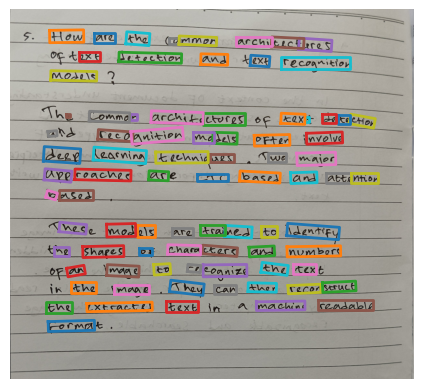

In [ ]:
polys = []
for poly in polys_raw:
  c = np.array(poly).astype(int).reshape((-1, 2))
  rect = cv2.minAreaRect(c)
  box = cv2.boxPoints(rect)
  polys.append(box)

fig, ax = plt.subplots()
ax.imshow(img)
for poly in polys:
  c = np.concatenate((poly, poly[0].reshape((-1, 2))))
  ax.plot(c[:, 0], c[:, 1], linewidth=2)
ax.axis("off")
plt.show()

Crop the text images, and transform them into flat rectange image.

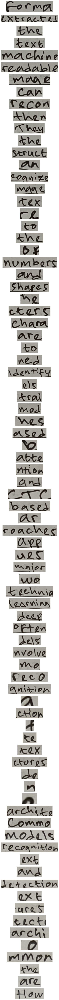

In [ ]:
def organize_points(rect):
  """
  Sort 4 vertices polygon into the same order
  [top-left, top-right, bottom-right, bottom-left]
  """
  # sort points based on the x coordinate
  # so the order now [left-1, left-2, right-1, right-2]
  # we don't know which one is top or bottom yet
  points = sorted(list(rect), key=lambda x: x[0])
  # for 2 left points
  # the point with smaller y become top-left
  if points[1][1] > points[0][1]:
      index_1 = 0
      index_4 = 1
  else:
      index_1 = 1
      index_4 = 0
  # for 2 right points
  # the point with smaller y become top-right
  if points[3][1] > points[2][1]:
      index_2 = 2
      index_3 = 3
  else:
      index_2 = 3
      index_3 = 2

  return np.array([
      points[index_1], points[index_2], points[index_3], points[index_4]
  ])

def extract_text_image(rect, img):
  """
  Given 4 vertices polygon, crop the image using that
  polygon, and transform the crop so that it is flat.
  """
  # get the top-left, top-right, bottom-right, and bottom-left points.
  rect = organize_points(rect)
  tl, tr, br, bl = rect

  # determine the flattened image width,
  # which is equal to the largest bottom/top side of the polygon
  widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
  widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
  maxWidth = max(int(widthA), int(widthB))

  # determine the flattened image height,
  # which is equal to the largest left/right side of the polygon
  heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
  heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
  maxHeight = max(int(heightA), int(heightB))

  # create the 4 vertices polygon after transformation
  dst = np.array(
    [
      [0, 0],
      [maxWidth - 1, 0],
      [maxWidth - 1, maxHeight - 1],
      [0, maxHeight - 1],
    ],
    dtype=np.float32,
  )
  # do the transformation
  M = cv2.getPerspectiveTransform(rect, dst)
  return cv2.warpPerspective(img, M, (maxWidth, maxHeight))

text_images = [extract_text_image(poly, img) for poly in polys]
fig, axs = plt.subplots(len(text_images), figsize=(5, len(text_images)*1), tight_layout=True)
for i, txt_img in enumerate(text_images):
  axs[i].imshow(txt_img)
  axs[i].axis("off")
plt.show()

Now we already have the text images, let's try running the inference of the text recognition

In [ ]:
REC_MODEL = SVTR_SYNTH
inferencer = TextRecInferencer(model=REC_MODEL["config"], weights=REC_MODEL["weights"])

text_images = []
texts = []
for poly in polys:
  poly_arr = np.array(poly).reshape((-1, 2)).astype(np.float32)
  txt_img = extract_text_image(poly_arr, img)
  rec_result = inferencer(txt_img)
  text_images.append(txt_img)
  texts.append(rec_result["predictions"][0]["text"])

Loads checkpoint by local backend from path: /content/svtr-base_20e_st_mj-ea500101.pth


Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Visualize!

In [ ]:
print(texts)

['forma', 'extractes', 'the', 'text', 'machine', 'readable', 'made', 'can', 'rrcon', 'then', 'they', 'the', 'struct', 'an', 'cognize', 'mage', 'tex', 'c', 'to', 'the', 'bx', 'numbers', 'and', 'shapes', 'he', 'cters', 'char', 'are', 'to', 'ned', 'identify', 'r1s', 'trai', 'mod', 'hes', 'ased', '6', 'atte', 'ntion', 'and', 'ctc', 'based', 'ar', 'roaches', 'app', 'uls', 'major', 'wo', 'trehnia', 'lrarning', 'derp', 'often', 'dels', 'nvolve', 'mo', 'prco', 'qnition', 'a', 'ction', 'x', 'tr', 'xex', 'clvres', 'do', 'i', 'a', 'archite', 'commo', 'models', 'recognition', 'rxt', 'and', 'detection', 'ext', 'ures', 'tect', 'archi', 'a', 'mmor', 'the', 'are', 'how']


In [ ]:
texts.reverse()

sentence = ' '.join(texts)

print(sentence)

how are the mmor a archi tect ures ext detection and rxt recognition models commo archite a i do clvres xex tr x ction a qnition prco mo nvolve dels often derp lrarning trehnia wo major uls app roaches ar based ctc and ntion atte 6 ased hes mod trai r1s identify ned to are char cters he shapes and numbers bx the to c tex mage cognize an struct the they then rrcon can made readable machine text the extractes forma


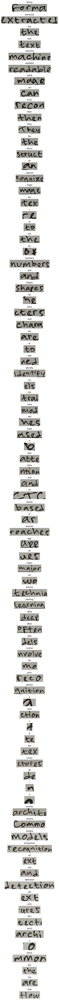

In [ ]:
fig, axs = plt.subplots(len(texts), figsize=(5, len(texts)*1), tight_layout=True)
for i, txt in enumerate(texts):
  axs[i].imshow(text_images[i])
  axs[i].set_title(txt)
  axs[i].axis("off")
plt.show()

### Error Rate

#### FastWER

In [ ]:
!pip install pybind11
!pip install fastwer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.7/227.7 kB 3.8 MB/s eta 0:00:00
  Using cached fastwer-0.1.3.tar.gz (4.6 kB)
  Preparing metadata (setup.py) ... done
  Created wheel for fastwer: filename=fastwer-0.1.3-cp310-cp310-linux_x86_64.whl size=827753 sha256=63e02c6080d20d236b96905d355d41fdaa44039080f2f626468946583631be22
  Stored in directory: /root/.cache/pip/wheels/99/b5/22/f6edc9a914bf3b54ebc55e258e2f9aa2297908d85799de228f
Successfully built fastwer


In [ ]:
import fastwer
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "how are the mmor a archi tect ures ext detection and rxt recognition models commo archite a i do clvres xex tr x ction a qnition prco mo nvolve dels often derp lrarning trehnia wo major uls app roaches ar based ctc and ntion atte 6 ased hes mod trai r1s identify ned to are char cters he shapes and numbers bx the to c tex mage cognize an struct the they then rrcon can made readable machine text the extractes forma"

print("CER:", fastwer.score_sent(recognition_result, ground_truth, char_level=True))
print("WER:", fastwer.score_sent(recognition_result, ground_truth, char_level=False))

CER: 50.2273
WER: 102.8571


#### PyWER

In [ ]:
!pip install pywer

In [ ]:
import pywer

ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "how are the mmor a archi tect ures ext detection and rxt recognition models commo archite a i do clvres xex tr x ction a qnition prco mo nvolve dels often derp lrarning trehnia wo major uls app roaches ar based ctc and ntion atte 6 ased hes mod trai r1s identify ned to are char cters he shapes and numbers bx the to c tex mage cognize an struct the they then rrcon can made readable machine text the extractes forma"


wer = pywer.wer(ground_truth, recognition_result)
cer = pywer.cer(ground_truth, recognition_result)
print(f"WER: {wer:.2f}, CER: {cer:.2f}")

WER: 107.16, CER: 89.90


#### JiWER

In [ ]:
!pip install jiwer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 9.6 MB/s eta 0:00:00


In [ ]:
import jiwer

ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "how are the mmor a archi tect ures ext detection and rxt recognition models commo archite a i do clvres xex tr x ction a qnition prco mo nvolve dels often derp lrarning trehnia wo major uls app roaches ar based ctc and ntion atte 6 ased hes mod trai r1s identify ned to are char cters he shapes and numbers bx the to c tex mage cognize an struct the they then rrcon can made readable machine text the extractes forma"


wer = jiwer.wer(ground_truth, recognition_result)
cer = jiwer.cer(ground_truth, recognition_result)

output_wer = jiwer.process_words(ground_truth, recognition_result)
wer_error = output_wer.wer

output_cer = jiwer.process_characters(ground_truth, recognition_result)
cer_error = output_cer.cer

print("wer:", wer)
print("cer:", cer)
print("wer error:", wer_error)
print("cer error:", cer_error)

wer: 1.0285714285714285
cer: 0.5022727272727273
wer error: 1.0285714285714285
cer error: 0.5022727272727273


#### Manual

In [ ]:
from difflib import ndiff

def calculate_cer(reference, hypothesis):

    total_chars = len(reference)
    errors = sum(el[0] in ('-', '+') for el in ndiff(reference, hypothesis))
    cer = errors / total_chars
    return cer

def calculate_wer(reference, hypothesis):

    reference = reference.split()
    hypothesis = hypothesis.split()
    total_words = len(reference)
    errors = sum(el[0] in ('-', '+') for el in ndiff(reference, hypothesis))
    wer = errors / total_words
    return wer

ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "how are the mmor a archi tect ures ext detection and rxt recognition models commo archite a i do clvres xex tr x ction a qnition prco mo nvolve dels often derp lrarning trehnia wo major uls app roaches ar based ctc and ntion atte 6 ased hes mod trai r1s identify ned to are char cters he shapes and numbers bx the to c tex mage cognize an struct the they then rrcon can made readable machine text the extractes forma"

ground_truth = ground_truth.replace('\n', ' ')

recognition_result = recognition_result.replace('\n', ' ')

cer = calculate_cer(ground_truth, recognition_result)
wer = calculate_wer(ground_truth, recognition_result)

print(f"CER: {cer}")
print(f"WER: {wer}")


CER: 1.5227272727272727
WER: 1.8


## TesseractOCR

In [ ]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 30 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 3s (1,774 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [ ]:
import pytesseract
from PIL import Image

img = Image.open("/content/images/5.jpg")
res = pytesseract.image_to_string(img, lang="eng")
print(res)

—$—_______
. i —

_F- How are the COmMMoen |

— archi tecteres

ane ee

<A Common acchi tL chu eo 6 maxX t AL KeCHO,
arts Cece Oanirier mole o n \nvolve

Z Laas vi Chniaue? Swe wmaier

Axe roaches ATE crc bases And attention
NC aoa oe a oe

Seco Models are *tained to \dent
the Shapes o¢ Chamctere ant numbers
6 AK \man e ko CLeoanize the text
ik she MAD 2 ‘Nhe Can whan eCeconseruc€
thre exteactes text in A machine scndable
oT MA .

 



### Error Rate

#### FastWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "—$—_______. i —_F- How are the COmMMoen |— archi tecteres ane ee <A Common acchi tL chu eo 6 maxX t AL KeCHO, arts Cece Oanirier mole o n \nvolve Z Laas vi Chniaue? Swe wmaier Axe roaches ATE crc bases And attention NC aoa oe a oe Seco Models are *tained to \dent the Shapes o¢ Chamctere ant numbers 6 AK \man e ko CLeoanize the text ik she MAD 2 ‘Nhe Can whan eCeconseruc€ thre exteactes text in A machine scndable oT MA ."

print("CER:", fastwer.score_sent(recognition_result, ground_truth, char_level=True))
print("WER:", fastwer.score_sent(recognition_result, ground_truth, char_level=False))

CER: 51.5909
WER: 104.2857


#### PyWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "—$—_______. i —_F- How are the COmMMoen |— archi tecteres ane ee <A Common acchi tL chu eo 6 maxX t AL KeCHO, arts Cece Oanirier mole o n \nvolve Z Laas vi Chniaue? Swe wmaier Axe roaches ATE crc bases And attention NC aoa oe a oe Seco Models are *tained to \dent the Shapes o¢ Chamctere ant numbers 6 AK \man e ko CLeoanize the text ik she MAD 2 ‘Nhe Can whan eCeconseruc€ thre exteactes text in A machine scndable oT MA ."


wer = pywer.wer(ground_truth, recognition_result)
cer = pywer.cer(ground_truth, recognition_result)
print(f"WER: {wer:.2f}, CER: {cer:.2f}")

WER: 111.55, CER: 93.84


#### JiWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "—$—_______. i —_F- How are the COmMMoen |— archi tecteres ane ee <A Common acchi tL chu eo 6 maxX t AL KeCHO, arts Cece Oanirier mole o n \nvolve Z Laas vi Chniaue? Swe wmaier Axe roaches ATE crc bases And attention NC aoa oe a oe Seco Models are *tained to \dent the Shapes o¢ Chamctere ant numbers 6 AK \man e ko CLeoanize the text ik she MAD 2 ‘Nhe Can whan eCeconseruc€ thre exteactes text in A machine scndable oT MA ."

wer = jiwer.wer(ground_truth, recognition_result)
cer = jiwer.cer(ground_truth, recognition_result)

output_wer = jiwer.process_words(ground_truth, recognition_result)
wer_error = output_wer.wer

output_cer = jiwer.process_characters(ground_truth, recognition_result)
cer_error = output_cer.cer

print("wer:", wer)
print("cer:", cer)
print("wer error:", wer_error)
print("cer error:", cer_error)

wer: 1.042857142857143
cer: 0.49318181818181817
wer error: 1.042857142857143
cer error: 0.49318181818181817


#### Manual

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "—$—_______. i —_F- How are the COmMMoen |— archi tecteres ane ee <A Common acchi tL chu eo 6 maxX t AL KeCHO, arts Cece Oanirier mole o n \nvolve Z Laas vi Chniaue? Swe wmaier Axe roaches ATE crc bases And attention NC aoa oe a oe Seco Models are *tained to \dent the Shapes o¢ Chamctere ant numbers 6 AK \man e ko CLeoanize the text ik she MAD 2 ‘Nhe Can whan eCeconseruc€ thre exteactes text in A machine scndable oT MA ."

ground_truth = ground_truth.replace('\n', ' ')

recognition_result = recognition_result.replace('\n', ' ')

cer = calculate_cer(ground_truth, recognition_result)
wer = calculate_wer(ground_truth, recognition_result)

print(f"CER: {cer}")
print(f"WER: {wer}")

CER: 1.4545454545454546
WER: 1.8857142857142857


## PaddleOCR

In [ ]:
!pip install paddleocr
!pip install paddlepaddle-gpu

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 465.7/465.7 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 46.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.2/299.2 kB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 67.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 78.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 MB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 MB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 88.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 97.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.6/239.6 kB 32.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 kB 14.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 kB 21.1 MB/s

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 749.8/749.8 MB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.9/75.9 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.9/76.9 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 8.4 MB/s eta 0:00:00


In [ ]:
from paddleocr import PaddleOCR, draw_ocr

paddleocr = PaddleOCR(use_gpu=True)

image_path = "/content/images/5.jpg"

result = paddleocr.ocr(image_path)
for line in result:
    line_text = ' '.join([word_info[-1][0] for word_info in line])
    print(line_text)


[2024/01/24 03:29:49] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=True, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/ch/ch_PP-OCRv4_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/ch/ch_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_char_dict_path='/

### Error Rate

#### FastWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "S. Howaresthe Common architecfures oftexe Jeteetion  and text recognition models ? Thex Common architectores of text deteetion recoanition models oFten involve deep Learnina teehnigues Two maior approaches areicTcbasedandattention based These modals sare trained toldentify the shapesofC charactersand numbers imaae the text 七 recoanize oF an inthejmaae They Can then reconstruct then texb ina machine readable extractel Format.2"

print("CER:", fastwer.score_sent(recognition_result, ground_truth, char_level=True))
print("WER:", fastwer.score_sent(recognition_result, ground_truth, char_level=False))

CER: 21.5909
WER: 74.2857


#### PyWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "S. Howaresthe Common architecfures oftexe Jeteetion  and text recognition models ? Thex Common architectores of text deteetion recoanition models oFten involve deep Learnina teehnigues Two maior approaches areicTcbasedandattention based These modals sare trained toldentify the shapesofC charactersand numbers imaae the text 七 recoanize oF an inthejmaae They Can then reconstruct then texb ina machine readable extractel Format.2"


wer = pywer.wer(ground_truth, recognition_result)
cer = pywer.cer(ground_truth, recognition_result)
print(f"WER: {wer:.2f}, CER: {cer:.2f}")

WER: 109.70, CER: 92.31


#### JiWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "S. Howaresthe Common architecfures oftexe Jeteetion  and text recognition models ? Thex Common architectores of text deteetion recoanition models oFten involve deep Learnina teehnigues Two maior approaches areicTcbasedandattention based These modals sare trained toldentify the shapesofC charactersand numbers imaae the text 七 recoanize oF an inthejmaae They Can then reconstruct then texb ina machine readable extractel Format.2"

wer = jiwer.wer(ground_truth, recognition_result)
cer = jiwer.cer(ground_truth, recognition_result)

output_wer = jiwer.process_words(ground_truth, recognition_result)
wer_error = output_wer.wer

output_cer = jiwer.process_characters(ground_truth, recognition_result)
cer_error = output_cer.cer

print("wer:", wer)
print("cer:", cer)
print("wer error:", wer_error)
print("cer error:", cer_error)

wer: 0.7428571428571429
cer: 0.21136363636363636
wer error: 0.7428571428571429
cer error: 0.21136363636363636


#### Manual

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "S. Howaresthe Common architecfures oftexe Jeteetion  and text recognition models ? Thex Common architectores of text deteetion recoanition models oFten involve deep Learnina teehnigues Two maior approaches areicTcbasedandattention based These modals sare trained toldentify the shapesofC charactersand numbers imaae the text 七 recoanize oF an inthejmaae They Can then reconstruct then texb ina machine readable extractel Format.2"

ground_truth = ground_truth.replace('\n', ' ')

recognition_result = recognition_result.replace('\n', ' ')

cer = calculate_cer(ground_truth, recognition_result)
wer = calculate_wer(ground_truth, recognition_result)

print(f"CER: {cer}")
print(f"WER: {wer}")

CER: 0.9886363636363636
WER: 1.1857142857142857


## EasyOCR

In [ ]:
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 32.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 36.0 MB/s eta 0:00:00


In [ ]:
import easyocr
reader = easyocr.Reader(["en"])
result = reader.readtext('/content/images/5.jpg', detail=0)
print(" ".join(result))

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete5 . How are thz Common archi tectyrg s OF text Jetectien Ana +ext recegnition Medels 2 Cemmon architectufes 6f kext Je aha Cec @Inition medels Ften involve L 2p (eacnins k eehniquer majer Apereaches Are CIC base An Altentien beSe4 Tnese mod els are tcained to th2 Shakes 6€ Chamcters aa numbers 6F@n Imge ED re eeguize texe in +he Jnnge Can +en CeconStruct . the Lxeract& texe In machine SeAdable Fecme The keeton (wo dentfY &hc They


### Error Rate

#### FastWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "How are thz Common archi tectyrg s OF text Jetectien Ana +ext recegnition Medels 2 Cemmon architectufes 6f kext Je aha Cec @Inition medels Ften involve L 2p (eacnins k eehniquer majer Apereaches Are CIC base An Altentien beSe4 Tnese mod els are tcained to th2 Shakes 6€ Chamcters aa numbers 6F@n Imge ED re eeguize texe in +he Jnnge Can +en CeconStruct . the Lxeract& texe In machine SeAdable Fecme The keeton (wo dentfY &hc They"

print("CER:", fastwer.score_sent(recognition_result, ground_truth, char_level=True))
print("WER:", fastwer.score_sent(recognition_result, ground_truth, char_level=False))

CER: 40.4545
WER: 101.4286


#### PyWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "How are thz Common archi tectyrg s OF text Jetectien Ana +ext recegnition Medels 2 Cemmon architectufes 6f kext Je aha Cec @Inition medels Ften involve L 2p (eacnins k eehniquer majer Apereaches Are CIC base An Altentien beSe4 Tnese mod els are tcained to th2 Shakes 6€ Chamcters aa numbers 6F@n Imge ED re eeguize texe in +he Jnnge Can +en CeconStruct . the Lxeract& texe In machine SeAdable Fecme The keeton (wo dentfY &hc They"


wer = pywer.wer(ground_truth, recognition_result)
cer = pywer.cer(ground_truth, recognition_result)
print(f"WER: {wer:.2f}, CER: {cer:.2f}")

WER: 112.74, CER: 94.87


#### JiWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "How are thz Common archi tectyrg s OF text Jetectien Ana +ext recegnition Medels 2 Cemmon architectufes 6f kext Je aha Cec @Inition medels Ften involve L 2p (eacnins k eehniquer majer Apereaches Are CIC base An Altentien beSe4 Tnese mod els are tcained to th2 Shakes 6€ Chamcters aa numbers 6F@n Imge ED re eeguize texe in +he Jnnge Can +en CeconStruct . the Lxeract& texe In machine SeAdable Fecme The keeton (wo dentfY &hc They"

wer = jiwer.wer(ground_truth, recognition_result)
cer = jiwer.cer(ground_truth, recognition_result)

output_wer = jiwer.process_words(ground_truth, recognition_result)
wer_error = output_wer.wer

output_cer = jiwer.process_characters(ground_truth, recognition_result)
cer_error = output_cer.cer

print("wer:", wer)
print("cer:", cer)
print("wer error:", wer_error)
print("cer error:", cer_error)

wer: 1.0142857142857142
cer: 0.4
wer error: 1.0142857142857142
cer error: 0.4


#### Manual

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "How are thz Common archi tectyrg s OF text Jetectien Ana +ext recegnition Medels 2 Cemmon architectufes 6f kext Je aha Cec @Inition medels Ften involve L 2p (eacnins k eehniquer majer Apereaches Are CIC base An Altentien beSe4 Tnese mod els are tcained to th2 Shakes 6€ Chamcters aa numbers 6F@n Imge ED re eeguize texe in +he Jnnge Can +en CeconStruct . the Lxeract& texe In machine SeAdable Fecme The keeton (wo dentfY &hc They"

ground_truth = ground_truth.replace('\n', ' ')

recognition_result = recognition_result.replace('\n', ' ')

cer = calculate_cer(ground_truth, recognition_result)
wer = calculate_wer(ground_truth, recognition_result)

print(f"CER: {cer}")
print(f"WER: {wer}")

CER: 1.5977272727272727
WER: 1.957142857142857


## MMOCR Trained

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r "/content/drive/MyDrive/computer-vision/handwriting" "./handwriting"

In [ ]:
### Text Detections
DBNETPP_IC15 = {
    "config": "/content/handwriting/train-det/dbnet_resnet50-dcnv2_fpnc_1200e_icdar2015.py",
    "weights": "/content/handwriting/train-det/epoch_50.pth"
}

### Text Recognition
SVTR_SYNTH = {
    "config": "/content/handwriting/train-rec/svtr-base_20e_st_mj.py",
    "weights": "/content/handwriting/train-rec/epoch_20.pth"
}

In [ ]:
1018 / 1091 /1010
IMAGE_TEST = "/content/handwriting/test/5.jpg"
DET_MODEL = DBNETPP_IC15

img = mmcv.imread(IMAGE_TEST, channel_order="rgb")
inferencer = TextDetInferencer(model=DET_MODEL["config"], weights=DET_MODEL["weights"])
det_result = inferencer(img)
polys_raw = det_result["predictions"][0]["polygons"]

Loads checkpoint by local backend from path: /content/handwriting/train-det/epoch_50.pth
01/25 09:44:06 - mmengine - INFO - ModulatedDeformConvPack backbone.layer2.0.conv2 is upgraded to version 2.
01/25 09:44:06 - mmengine - INFO - ModulatedDeformConvPack backbone.layer2.1.conv2 is upgraded to version 2.
01/25 09:44:06 - mmengine - INFO - ModulatedDeformConvPack backbone.layer2.2.conv2 is upgraded to version 2.
01/25 09:44:06 - mmengine - INFO - ModulatedDeformConvPack backbone.layer2.3.conv2 is upgraded to version 2.
01/25 09:44:06 - mmengine - INFO - ModulatedDeformConvPack backbone.layer3.0.conv2 is upgraded to version 2.
01/25 09:44:06 - mmengine - INFO - ModulatedDeformConvPack backbone.layer3.1.conv2 is upgraded to version 2.
01/25 09:44:06 - mmengine - INFO - ModulatedDeformConvPack backbone.layer3.2.conv2 is upgraded to version 2.
01/25 09:44:06 - mmengine - INFO - ModulatedDeformConvPack backbone.layer3.3.conv2 is upgraded to version 2.
01/25 09:44:06 - mmengine - INFO - Modu

Output()

/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '
/usr/local/lib/python3.10/dist-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.TensorboardVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


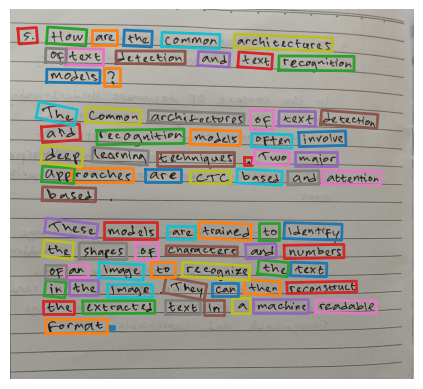

In [ ]:
polys = []
for poly in polys_raw:
  c = np.array(poly).astype(int).reshape((-1, 2))
  rect = cv2.minAreaRect(c)
  box = cv2.boxPoints(rect)
  polys.append(box)

fig, ax = plt.subplots()
ax.imshow(img)
for poly in polys:
  c = np.concatenate((poly, poly[0].reshape((-1, 2))))
  ax.plot(c[:, 0], c[:, 1], linewidth=2)
ax.axis("off")
plt.show()

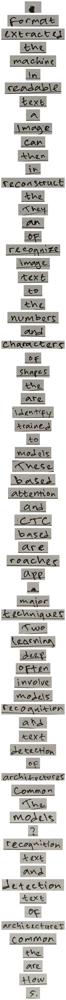

In [ ]:
def organize_points(rect):
  """
  Sort 4 vertices polygon into the same order
  [top-left, top-right, bottom-right, bottom-left]
  """
  # sort points based on the x coordinate
  # so the order now [left-1, left-2, right-1, right-2]
  # we don't know which one is top or bottom yet
  points = sorted(list(rect), key=lambda x: x[0])
  # for 2 left points
  # the point with smaller y become top-left
  if points[1][1] > points[0][1]:
      index_1 = 0
      index_4 = 1
  else:
      index_1 = 1
      index_4 = 0
  # for 2 right points
  # the point with smaller y become top-right
  if points[3][1] > points[2][1]:
      index_2 = 2
      index_3 = 3
  else:
      index_2 = 3
      index_3 = 2

  return np.array([
      points[index_1], points[index_2], points[index_3], points[index_4]
  ])

def extract_text_image(rect, img):
  """
  Given 4 vertices polygon, crop the image using that
  polygon, and transform the crop so that it is flat.
  """
  # get the top-left, top-right, bottom-right, and bottom-left points.
  rect = organize_points(rect)
  tl, tr, br, bl = rect

  # determine the flattened image width,
  # which is equal to the largest bottom/top side of the polygon
  widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
  widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
  maxWidth = max(int(widthA), int(widthB))

  # determine the flattened image height,
  # which is equal to the largest left/right side of the polygon
  heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
  heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
  maxHeight = max(int(heightA), int(heightB))

  # create the 4 vertices polygon after transformation
  dst = np.array(
    [
      [0, 0],
      [maxWidth - 1, 0],
      [maxWidth - 1, maxHeight - 1],
      [0, maxHeight - 1],
    ],
    dtype=np.float32,
  )
  # do the transformation
  M = cv2.getPerspectiveTransform(rect, dst)
  return cv2.warpPerspective(img, M, (maxWidth, maxHeight))

text_images = [extract_text_image(poly, img) for poly in polys]
fig, axs = plt.subplots(len(text_images), figsize=(5, len(text_images)*1), tight_layout=True)
for i, txt_img in enumerate(text_images):
  axs[i].imshow(txt_img)
  axs[i].axis("off")
plt.show()

In [ ]:
REC_MODEL = SVTR_SYNTH
inferencer = TextRecInferencer(model=REC_MODEL["config"], weights=REC_MODEL["weights"])

text_images = []
texts = []
for poly in polys:
  poly_arr = np.array(poly).reshape((-1, 2)).astype(np.float32)
  txt_img = extract_text_image(poly_arr, img)
  rec_result = inferencer(txt_img)
  text_images.append(txt_img)
  texts.append(rec_result["predictions"][0]["text"])

Loads checkpoint by local backend from path: /content/handwriting/train-rec/epoch_20.pth


Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

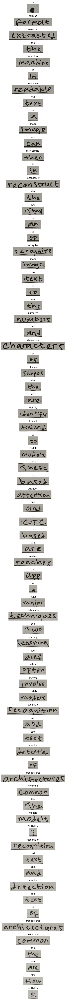

In [ ]:
fig, axs = plt.subplots(len(texts), figsize=(5, len(texts)*1), tight_layout=True)
for i, txt in enumerate(texts):
  axs[i].imshow(text_images[i])
  axs[i].set_title(txt)
  axs[i].axis("off")
plt.show()

In [ ]:
texts.reverse()

sentence = ' '.join(texts)

print(sentence)

s<UKN> how are the common architectures of text detection and text recognition 3<UKN> models the common architectures of detection text and recognition models involve often deer learning two techniques major a apr roaches are based ctc and attention based these models to trained identify are the shapes of characters and numbers the to text image recognize of an they the reconscruct in then<UKN> can image a text readable in machine the extracted format a


### Error Rate

#### FastWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "s<UKN> how are the common architectures of text detection and text recognition 3<UKN> models the common architectures of detection text and recognition models involve often deer learning two techniques major a apr roaches are based ctc and attention based these models to trained identify are the shapes of characters and numbers the to text image recognize of an they the reconscruct in then<UKN> can image a text readable in machine the extracted format a"

print("CER:", fastwer.score_sent(recognition_result, ground_truth, char_level=True))
print("WER:", fastwer.score_sent(recognition_result, ground_truth, char_level=False))

CER: 34.3182
WER: 61.4286


#### PyWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "s<UKN> how are the common architectures of text detection and text recognition 3<UKN> models the common architectures of detection text and recognition models involve often deer learning two techniques major a apr roaches are based ctc and attention based these models to trained identify are the shapes of characters and numbers the to text image recognize of an they the reconscruct in then<UKN> can image a text readable in machine the extracted format a"


wer = pywer.wer(ground_truth, recognition_result)
cer = pywer.cer(ground_truth, recognition_result)
print(f"WER: {wer:.2f}, CER: {cer:.2f}")

WER: 108.89, CER: 91.82


#### JiWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "s<UKN> how are the common architectures of text detection and text recognition 3<UKN> models the common architectures of detection text and recognition models involve often deer learning two techniques major a apr roaches are based ctc and attention based these models to trained identify are the shapes of characters and numbers the to text image recognize of an they the reconscruct in then<UKN> can image a text readable in machine the extracted format a"

wer = jiwer.wer(ground_truth, recognition_result)
cer = jiwer.cer(ground_truth, recognition_result)

output_wer = jiwer.process_words(ground_truth, recognition_result)
wer_error = output_wer.wer

output_cer = jiwer.process_characters(ground_truth, recognition_result)
cer_error = output_cer.cer

print("wer:", wer)
print("cer:", cer)
print("wer error:", wer_error)
print("cer error:", cer_error)

wer: 0.6142857142857143
cer: 0.3431818181818182
wer error: 0.6142857142857143
cer error: 0.3431818181818182


#### Manual

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "s<UKN> how are the common architectures of text detection and text recognition 3<UKN> models the common architectures of detection text and recognition models involve often deer learning two techniques major a apr roaches are based ctc and attention based these models to trained identify are the shapes of characters and numbers the to text image recognize of an they the reconscruct in then<UKN> can image a text readable in machine the extracted format a"

ground_truth = ground_truth.replace('\n', ' ')

recognition_result = recognition_result.replace('\n', ' ')

cer = calculate_cer(ground_truth, recognition_result)
wer = calculate_wer(ground_truth, recognition_result)

print(f"CER: {cer}")
print(f"WER: {wer}")

CER: 1.1568181818181817
WER: 0.9714285714285714


## MMOCR Trained + SpellChecker (app.py)

### Error Rate

#### FastWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "how are the common architectures of text detection and text recognition models the common architectures of detection text and recognition models involve often deer learning two techniques major a air roaches are based csc and attention based these models to trained identify are the shapes of characters and numbers the to text image recognize of an they the reconstruct in can image a text readable in machine the extracted format a"

print("CER:", fastwer.score_sent(recognition_result, ground_truth, char_level=True))
print("WER:", fastwer.score_sent(recognition_result, ground_truth, char_level=False))

CER: 31.5909
WER: 58.5714


#### PyWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "how are the common architectures of text detection and text recognition models the common architectures of detection text and recognition models involve often deer learning two techniques major a air roaches are based csc and attention based these models to trained identify are the shapes of characters and numbers the to text image recognize of an they the reconstruct in can image a text readable in machine the extracted format a"

wer = pywer.wer(ground_truth, recognition_result)
cer = pywer.cer(ground_truth, recognition_result)
print(f"WER: {wer:.2f}, CER: {cer:.2f}")

WER: 107.69, CER: 90.53


#### JiWER

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "how are the common architectures of text detection and text recognition models the common architectures of detection text and recognition models involve often deer learning two techniques major a air roaches are based csc and attention based these models to trained identify are the shapes of characters and numbers the to text image recognize of an they the reconstruct in can image a text readable in machine the extracted format a"

wer = jiwer.wer(ground_truth, recognition_result)
cer = jiwer.cer(ground_truth, recognition_result)

output_wer = jiwer.process_words(ground_truth, recognition_result)
wer_error = output_wer.wer

output_cer = jiwer.process_characters(ground_truth, recognition_result)
cer_error = output_cer.cer

print("wer:", wer)
print("cer:", cer)
print("wer error:", wer_error)
print("cer error:", cer_error)

wer: 0.5857142857142857
cer: 0.3159090909090909
wer error: 0.5857142857142857
cer error: 0.3159090909090909


#### Manual

In [ ]:
ground_truth = "5. How are the common architectures of text detection and text recognition models? The common architectures of text detection and recognition models often involve deep learning techniques. Two major approaches are CTC based and attention based. These models are trained to identify the shapes of characters or numbers on an image to recognize the text in the image. They can then reconstruct the extracted text in a machine readable format."
recognition_result = "how are the common architectures of text detection and text recognition models the common architectures of detection text and recognition models involve often deer learning two techniques major a air roaches are based csc and attention based these models to trained identify are the shapes of characters and numbers the to text image recognize of an they the reconstruct in can image a text readable in machine the extracted format a"

ground_truth = ground_truth.replace('\n', ' ')

recognition_result = recognition_result.replace('\n', ' ')

cer = calculate_cer(ground_truth, recognition_result)
wer = calculate_wer(ground_truth, recognition_result)

print(f"CER: {cer}")
print(f"WER: {wer}")

CER: 1.084090909090909
WER: 0.9285714285714286
